# Импорт

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import warnings
warnings.filterwarnings('ignore')
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, f1_score, recall_score
from sklearn.feature_extraction.text import  CountVectorizer, TfidfTransformer
from sklearn.model_selection import train_test_split

In [8]:
df = pd.read_csv('df.csv', index_col=0)

In [11]:
df = df.fillna('') #заполняем пропуски, чтобы далее не возникло ошибок

---

# 2.1 Классификация документов

## Для классификации выбраны:
- `KNeighborsClassifier` - метод k-ближайших соседей
- `RandomForestClassifier` - дерево решений
- `LogisticRegression` - линейная модель классификации

для начала разделим набор на тестовую и тренировочную выборки и посмотрим, как обучится модель используя только текст документа и адресатов

In [15]:
X_train, X_test, y_train, y_test = train_test_split(df["content"], df["adresat"])

применим к данным с помощью Pipeline следущие методы:
- векторизацию (CountVectorizer)
- нормализацию (TfidfTransformer)
- модель (KNeighborsClassifier/RandomForestClassifier/LogisticRegression)

In [ ]:
models = [
    KNeighborsClassifier(),
    RandomForestClassifier(),
    LogisticRegression()
]
for model in models:
    print(str(model))
    #pipeline (конвейер, объединяющий несколько действий)
    pipe = Pipeline([('vect', CountVectorizer()), ('tfidf', TfidfTransformer()), ('clf', model)]) 
    text_clf = pipe.fit(X_train, y_train)
    #обучение на тестовом наборе
    pred = text_clf.predict(X_test)
    print('\taccuracy_score', accuracy_score(pred, y_test))
    print('\tf1_score', f1_score(pred, y_test, average='weighted'))
    print('\trecall_score', recall_score(pred, y_test, average='macro'))
    print('<=====================>')

KNeighborsClassifier()
	accuracy_score 0.6505636070853462
	f1_score 0.6842825601309478
	recall_score 0.1637164884035808
<=====================>
RandomForestClassifier()
	accuracy_score 0.7045088566827697
	f1_score 0.7428526239669679
	recall_score 0.22287706282550718
<=====================>
LogisticRegression()


как видим, модели показали не очень удоволетворительные результаты, поэтому далее нашей задачей будет улучшить их

## Вывод:
На данном этапе мы:
- разделили набор данных на тестовую и тренировочную выборки, использовав текст документа и адресатов, чтобы исследовать как поведет себя модель при таком разделении
- выбрали три классификатора и провели предворительное обучение на тестовой выборке

---

# 2.2 Визуализация зависимостей данных

На данном этапе на необходимо провизуализировать зависимости атрибутов от целевой переменной, то есть адресатов

### Визуализизация будет построена с помощью:
- `barplot` - она отразит наиболее наглядно, какаие слова наиболее встречаемы по отношению к тому или иному адресату и количество вхождений этих слов
- `WordCloud` - помогает нам узнать частоту появления слова в текстовом контенте с помощью визуализации 

Для удобства мы перегруппируем данные, которые будем использовать, с помощью метода groupby

In [31]:
df['content'] = df['content'].apply(lambda x: x + ' ') #добавляем пробелы после каждой строки, чтобы далее предложения не сливались в одно слово 

In [34]:
data = df.groupby(['adresat'])['content', 'organization_author'].agg('sum').reset_index()

In [67]:
data.head()

,adresat,content,organization_author
0,Абдуллин А.М.,возврат заявка возврат документ ао газпромнефт...,ООО ИКТ Казань АО Газпромнефть ОНПЗ
1,Алимов А.А.,участие общегородской программа весенний недел...,ГБУ города Москвы Ресурсный центр по развит...
2,Антонов Ю.В.,участие мч казань участие чемпионат профессион...,ФГОБУ ВО Поволжский государственный универс...
3,Артемова Т.В.,направление акт сверка,АО Центр судоремонта Звездочка
4,Афанасьева С.Н.Хуснутдинова И.И.Камалетдинова ...,протокол совещание дигиталскиллс,Министерство информатизации и связи Республи...


## Визуализация зависимости текста документа и адресата

проводим векторизацию для определения количество вхождений и результат преобразовываем в датафрейм

In [36]:
cv = CountVectorizer(ngram_range=(1,2), max_features=500) #ngram_range=(1,2) позволяет нам выбрать не только ключевые слова, но и биграммы, то есть словосочетания из двух слов
cvA = cv.fit_transform(data["content"]).toarray()
cvDF = pd.DataFrame(cvA, columns=cv.get_feature_names())

к полученному датафрейму добавляем адресатов, то есть нашу целевую переменную

In [65]:
cvDF["T"] = data['adresat']

создаем функцию для предобработки данных для визуализации

In [41]:
def plott(tar):
    # данные для одного графика по oX
    x=[]    
    # данные для одного графика по oY
    y=[]
    MO = cvDF[cvDF["T"] == tar].drop("T",axis=1) 
    for i in range(MO.shape[0]): 
        for j in cvDF.drop("T",axis=1): 
            if MO.iloc[i][j]>3: 
                x.append(j)
                y.append(MO.iloc[i][j])
    return x,y

визуализируем графики с каждым адресатом, всего получится 161 график

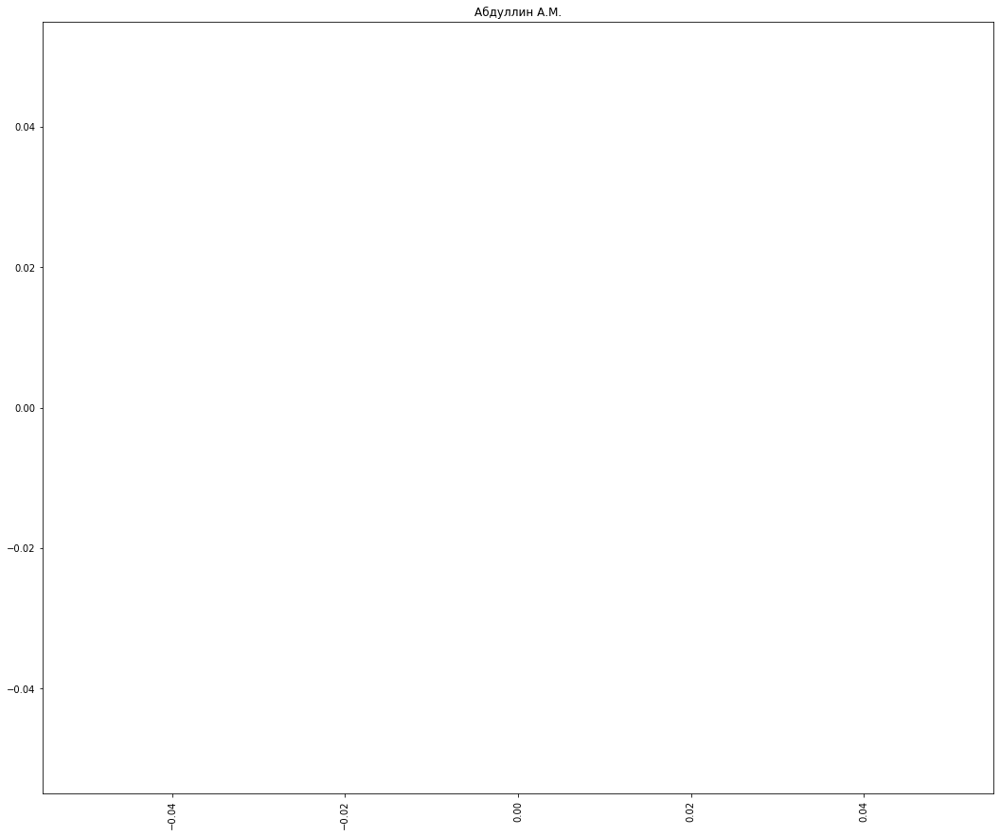

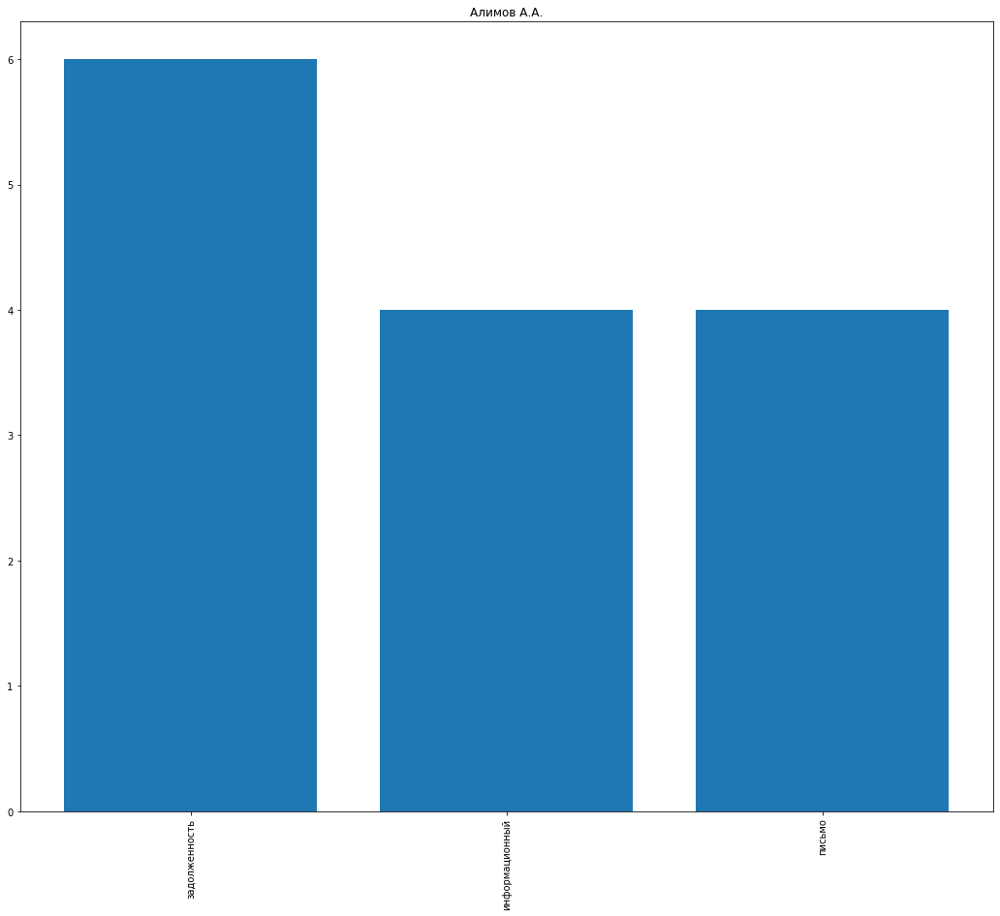

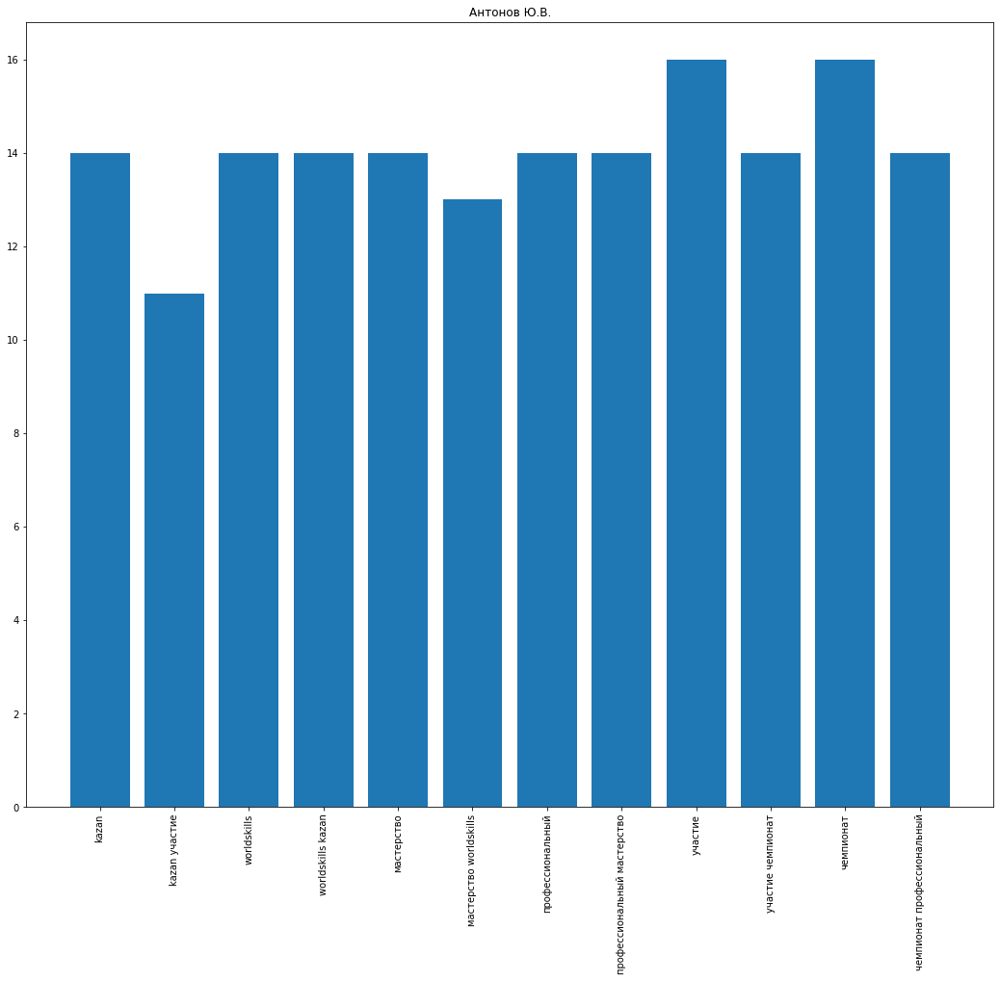

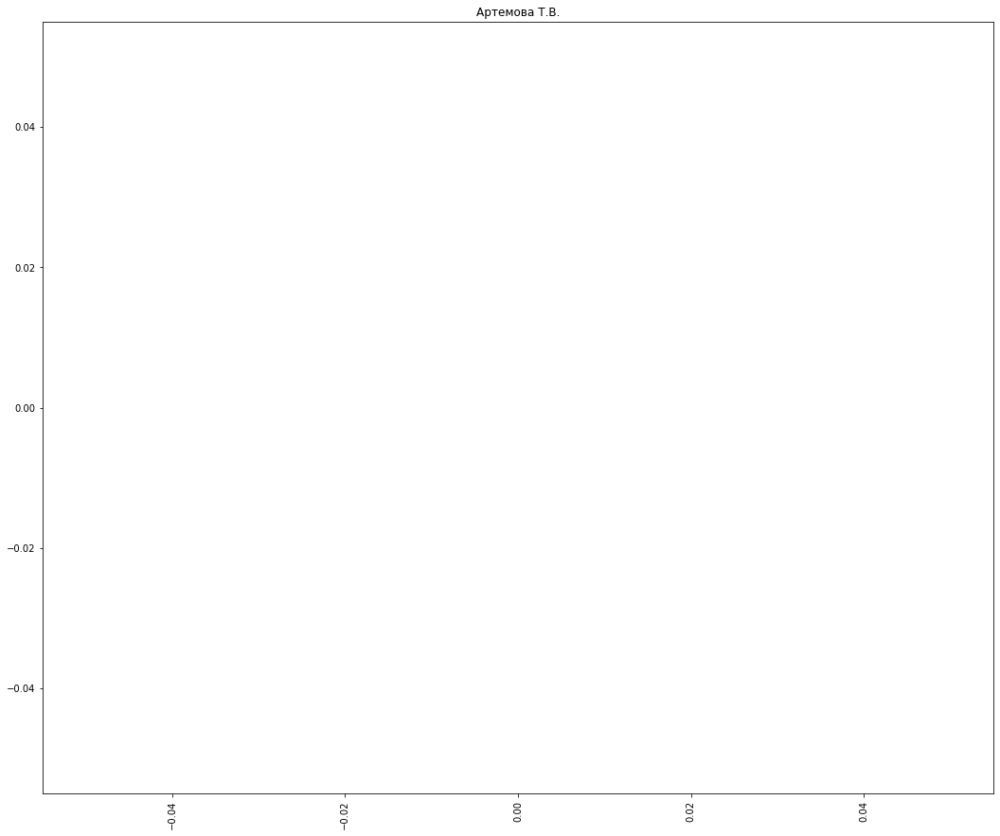

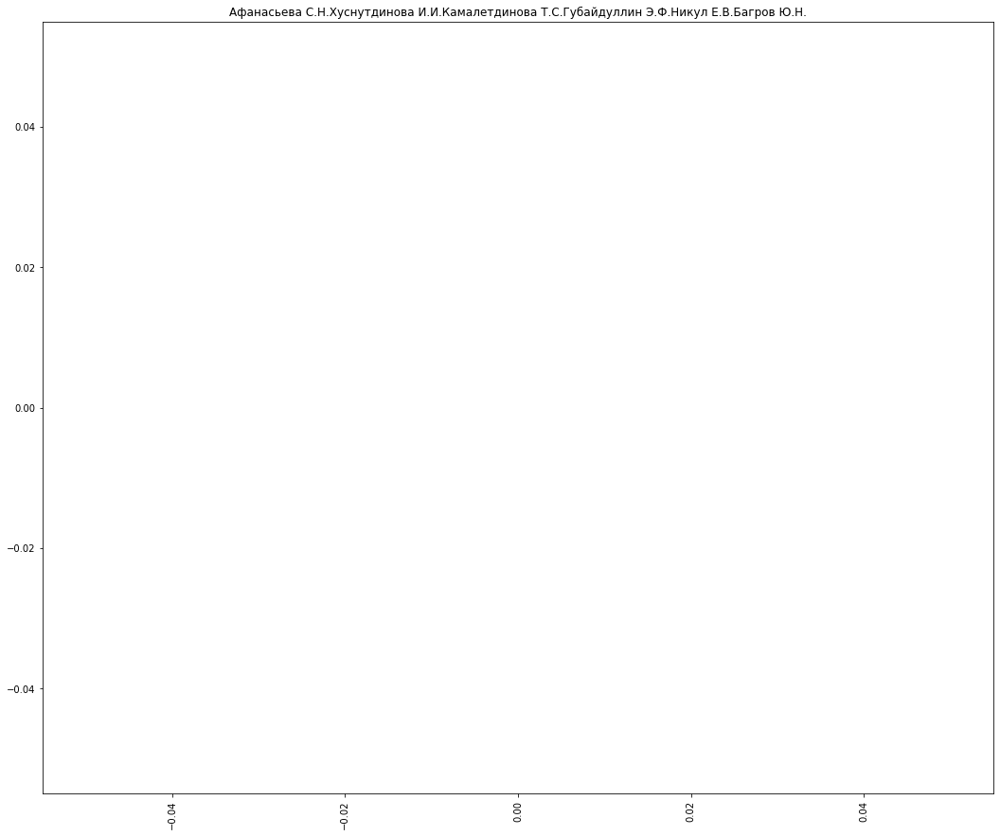

...

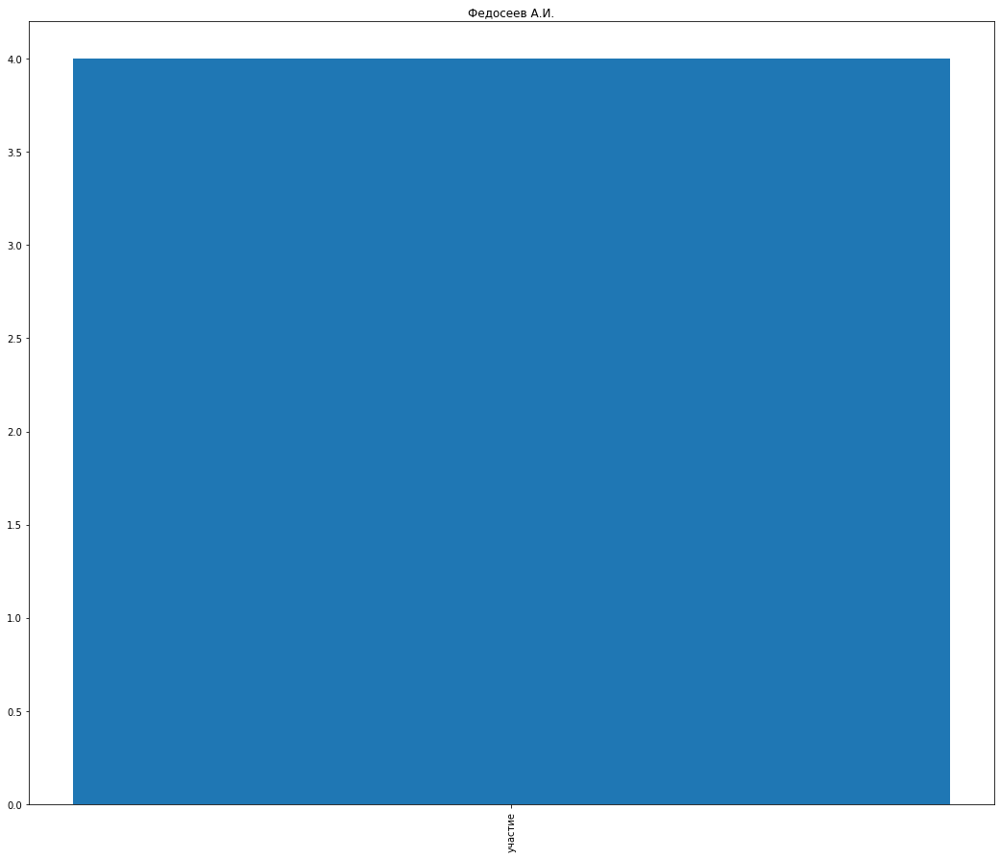

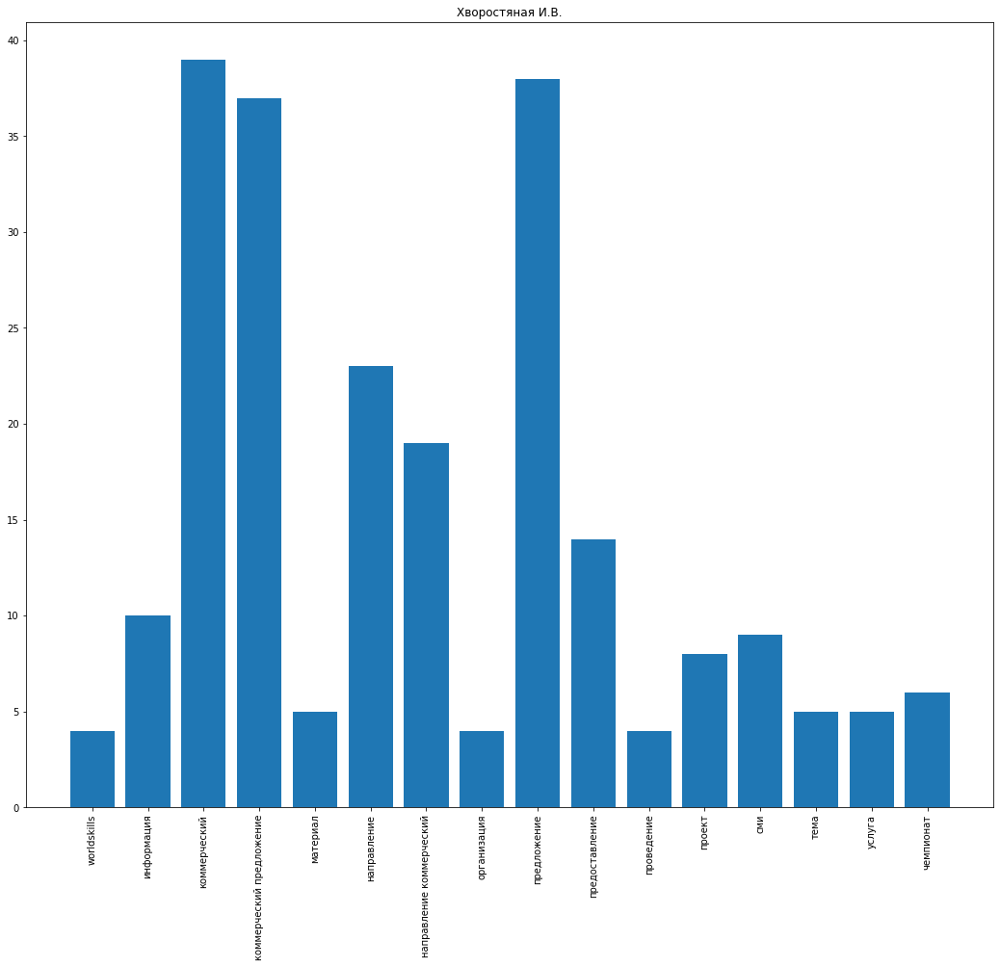

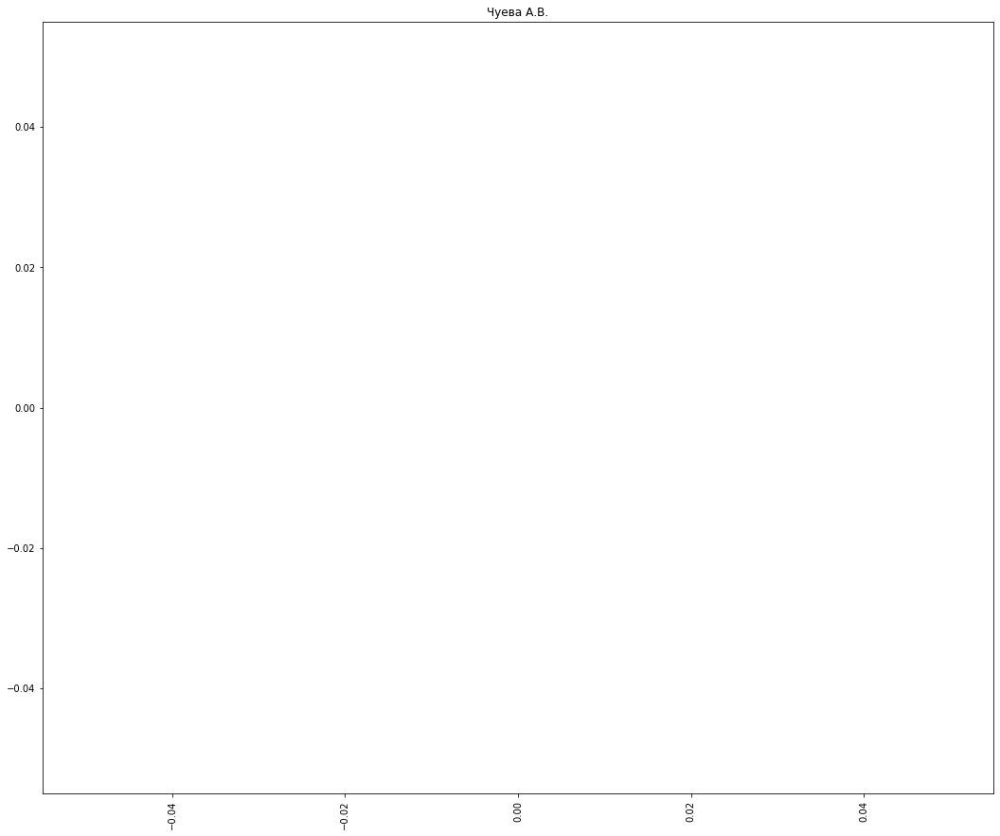

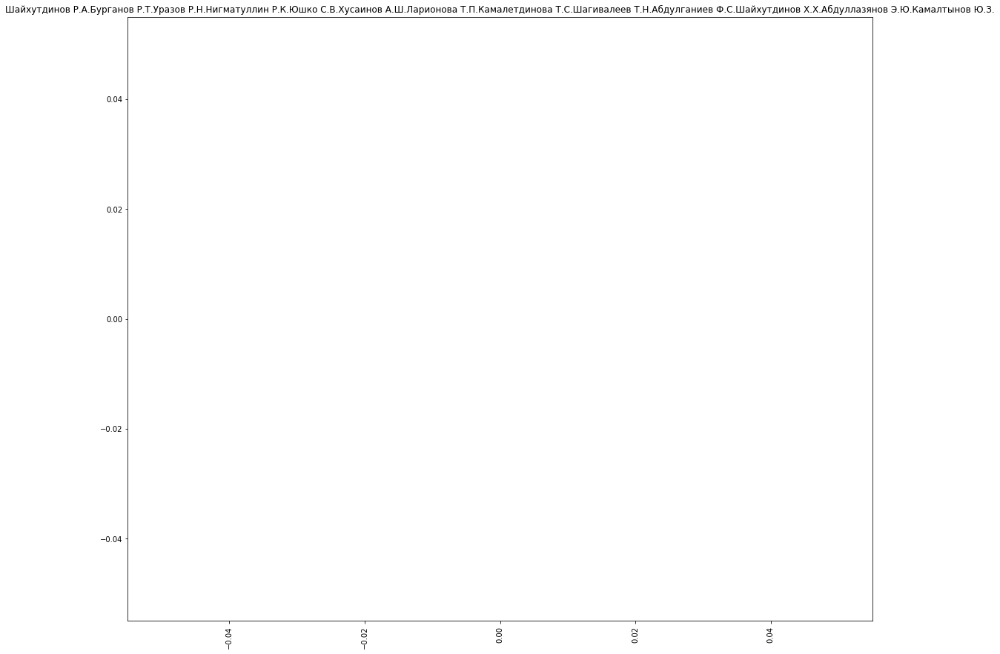

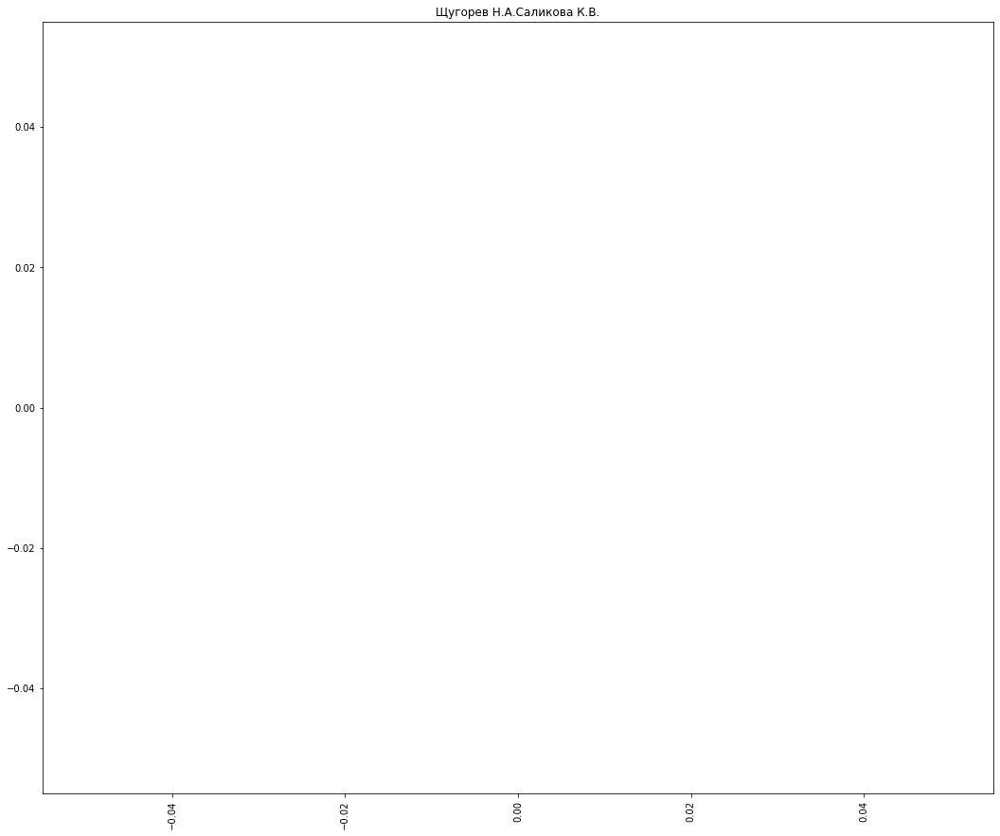

In [42]:
for i in data['adresat']:
    x,y = plott(i)
    plt.figure(figsize=(18,15))
    plt.bar(x,y)
    plt.title(i)
    plt.xticks(rotation='vertical')
    plt.show()

как мы видим, некоторые графики получились пустые, так вышло из-за отсутствия достаточного количества слов по отношению определенных адресатов

## Визуализация зависимости организации, из которой отправлено письмо и адресата

сейчас мы проделываем те же действия, что и с прошлой визуализацией

In [62]:
from sklearn.feature_extraction.text import  CountVectorizer
cv = CountVectorizer(ngram_range=(1,2), max_features=500)
cvA = cv.fit_transform(data["organization_author"]).toarray()
cvDF = pd.DataFrame(cvA, columns=cv.get_feature_names())

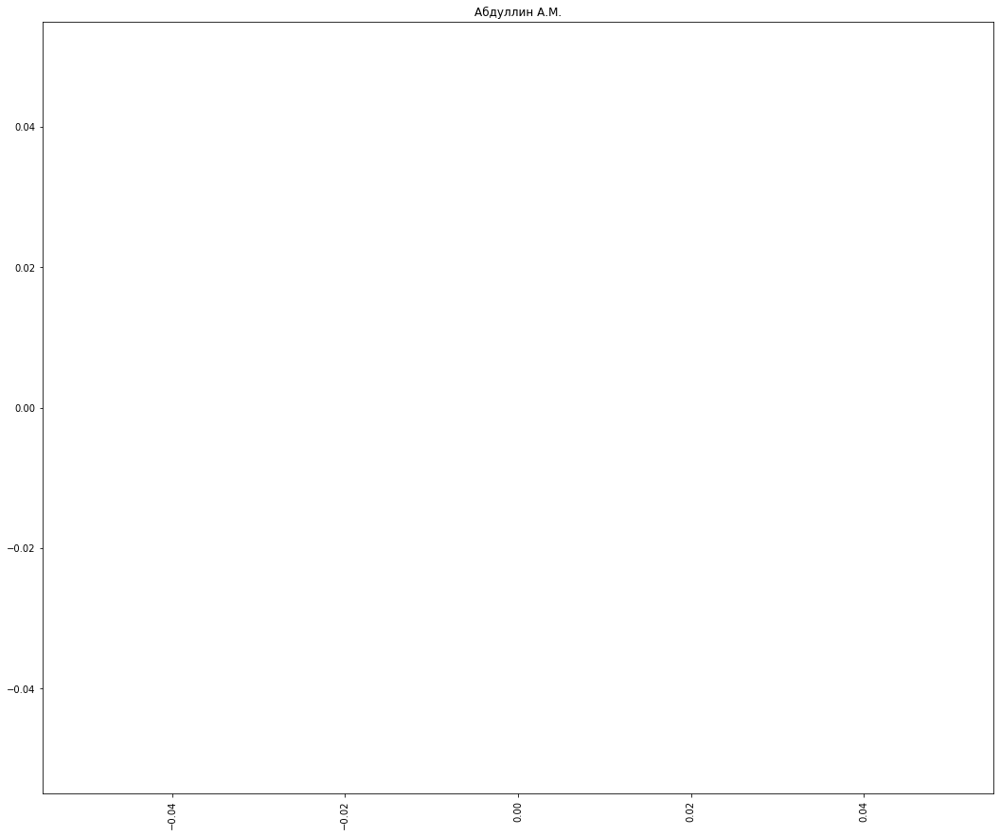

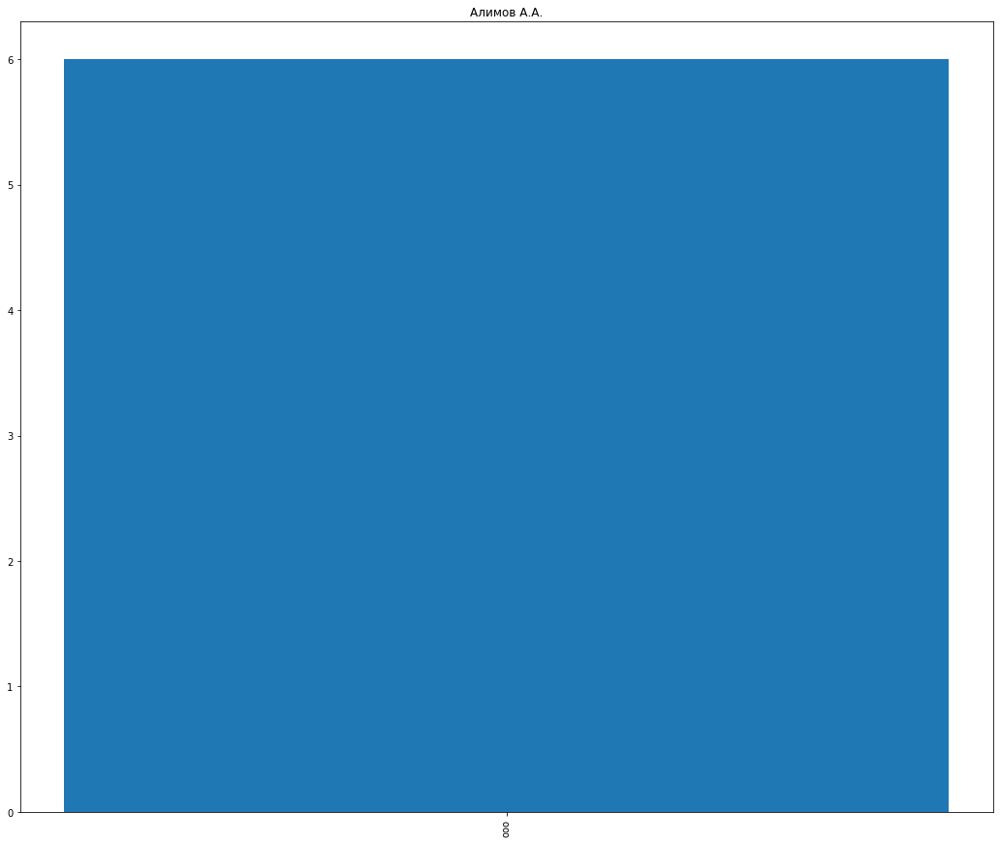

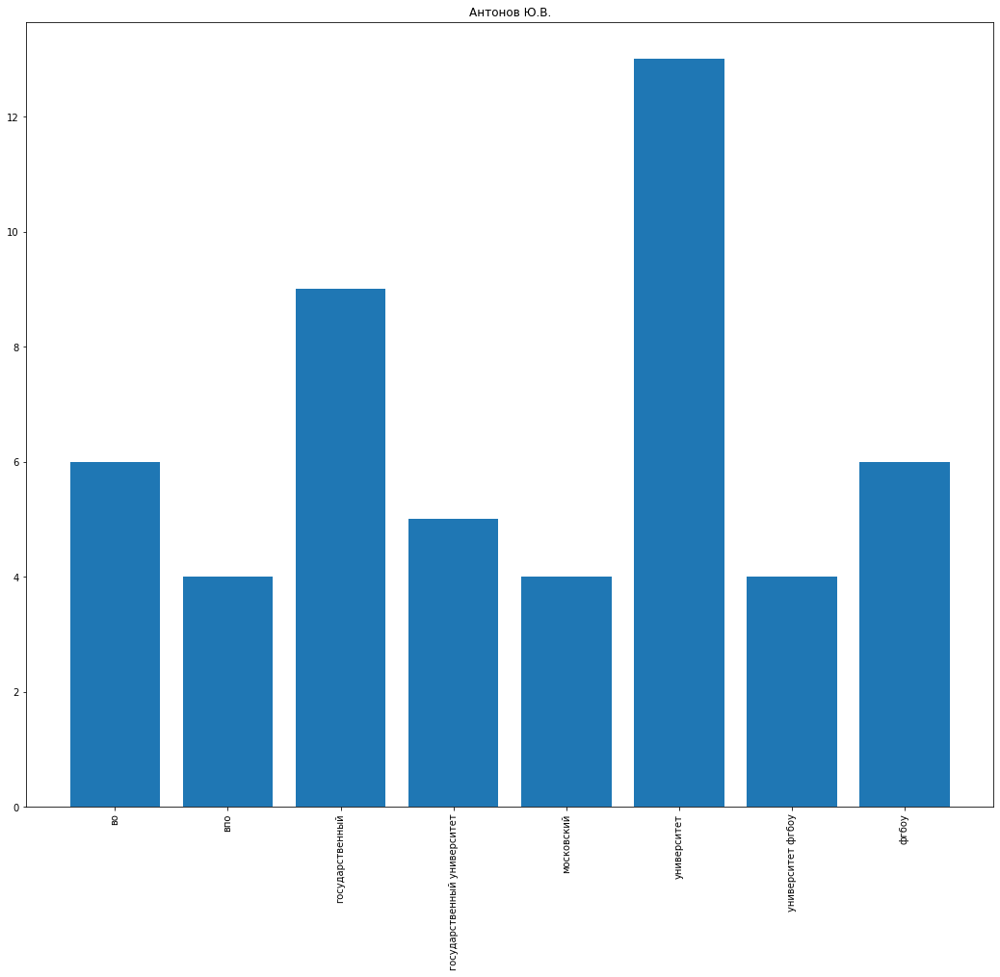

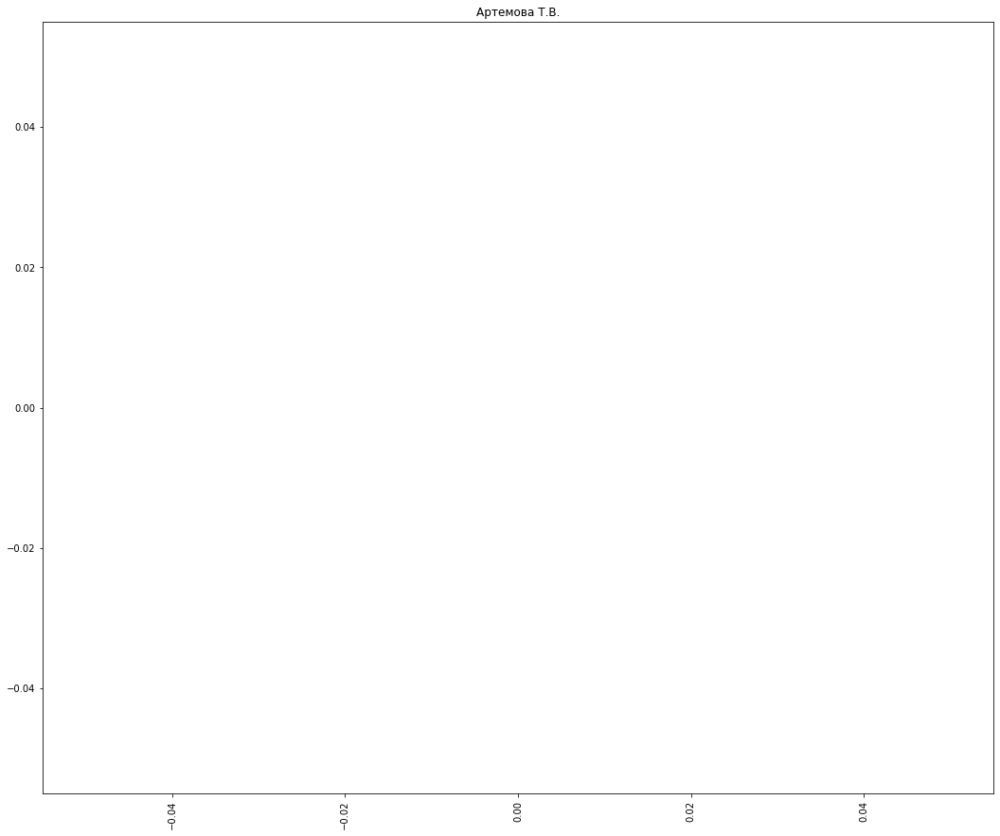

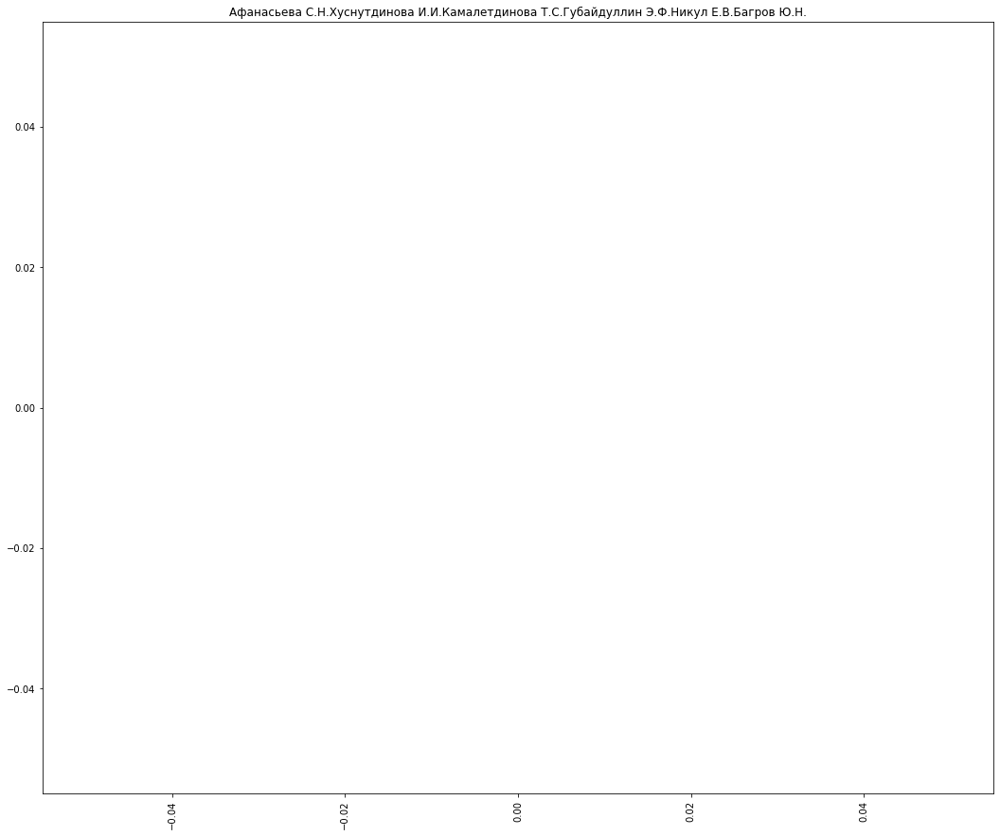

...

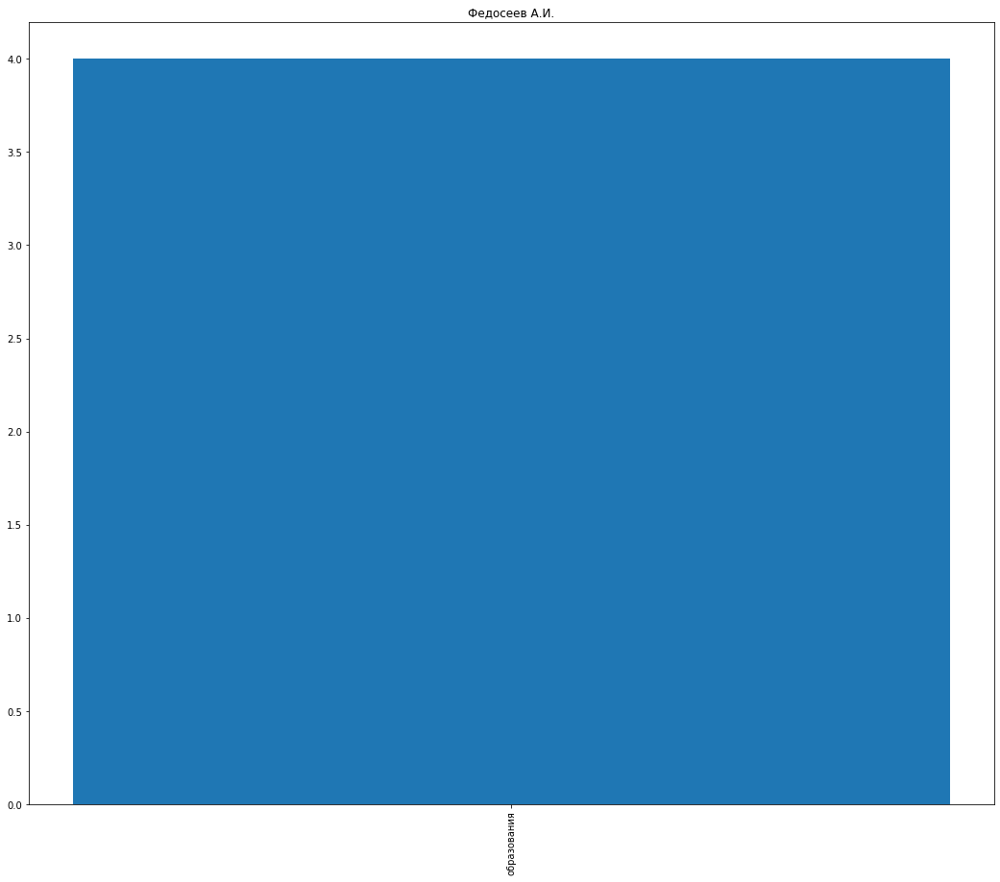

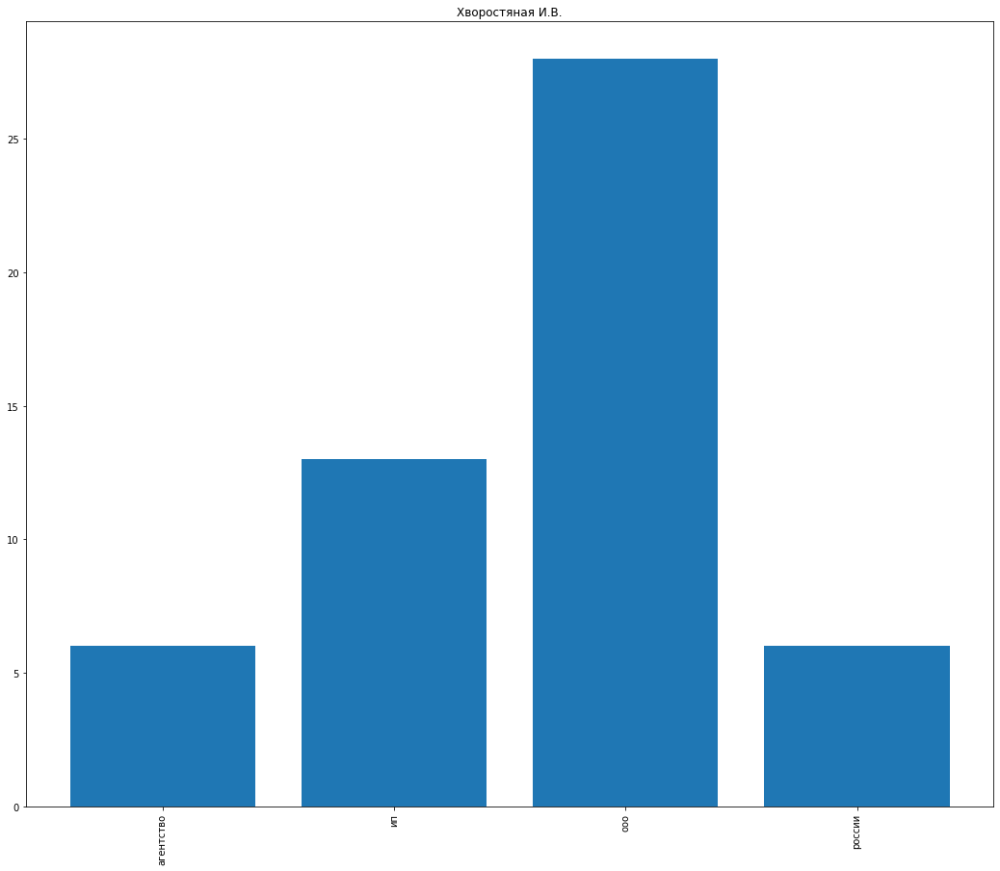

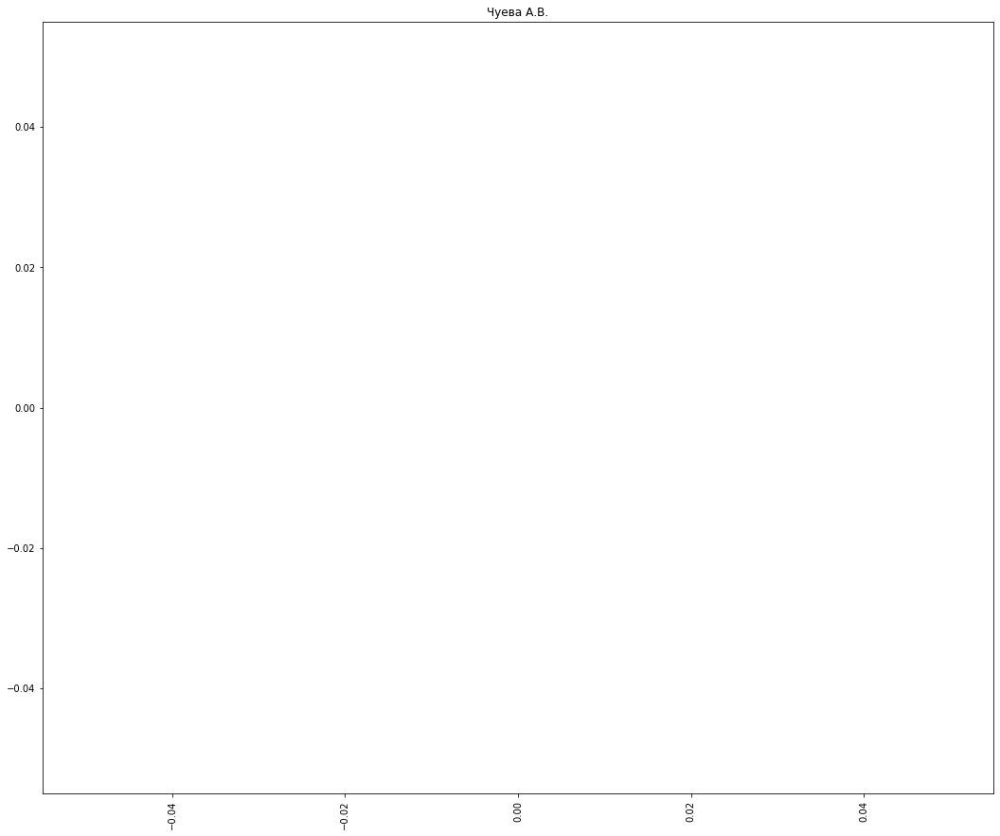

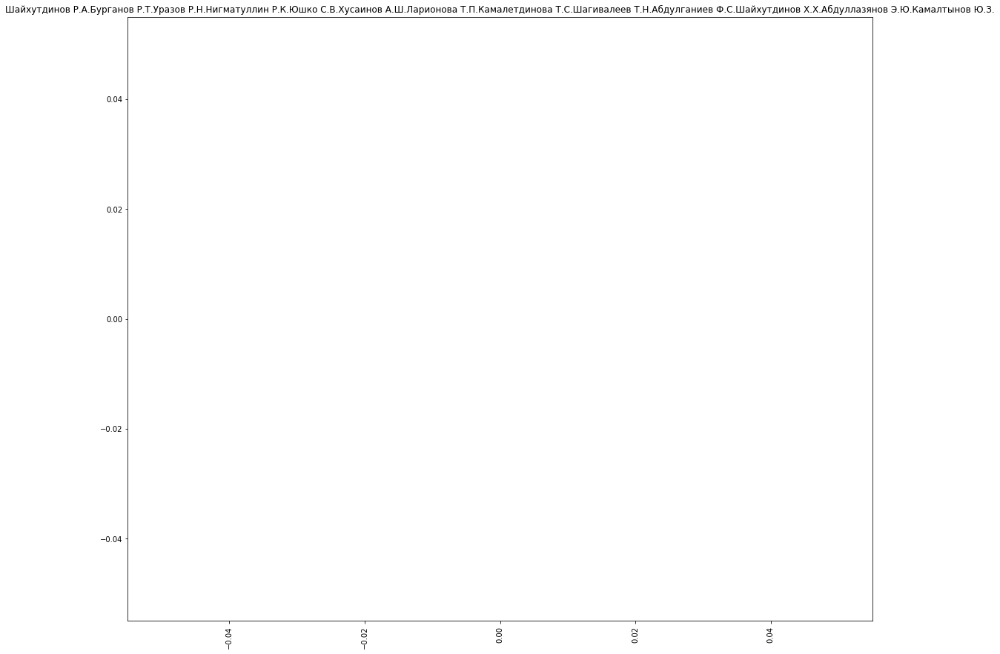

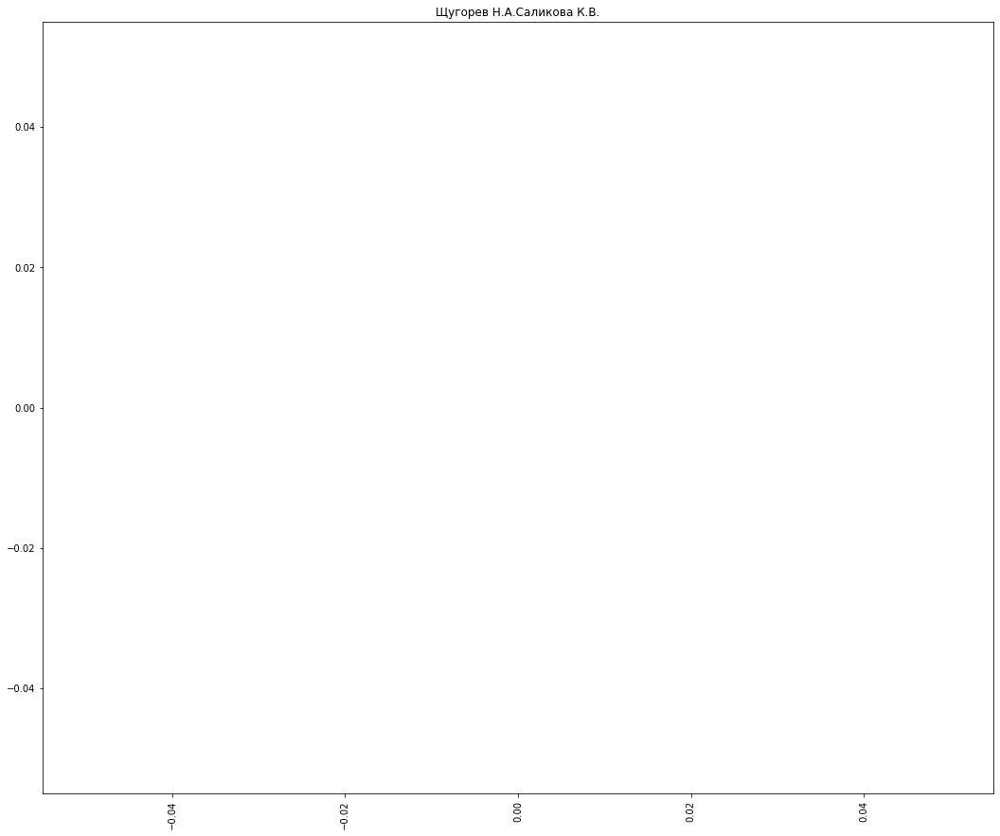

In [66]:
for i in data['adresat']:
    x,y = plott(i)
    plt.figure(figsize=(18,15))
    plt.bar(x,y)
    plt.title(i)
    plt.xticks(rotation='vertical')
    plt.show()

здесь также некоторые графики получились без данных

## Визуализация с помощью WordCloud (зависимость текста от адресатов)

In [1]:
cvDF = cvDF.drop(["T"], axis=1) #дропаем адресатов для дальнейшей корректной работы визуализации

NameError: name 'cvDF' is not defined

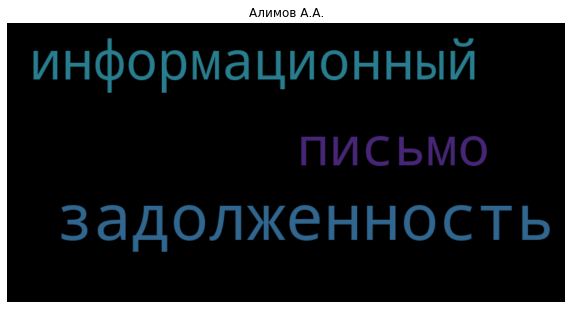

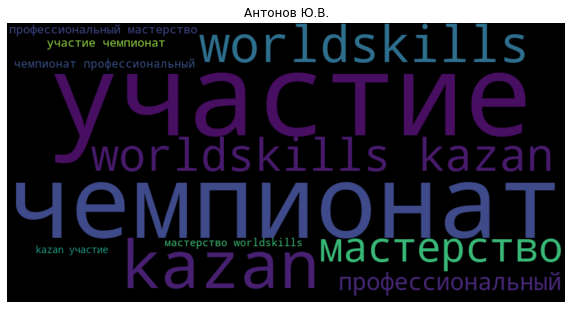

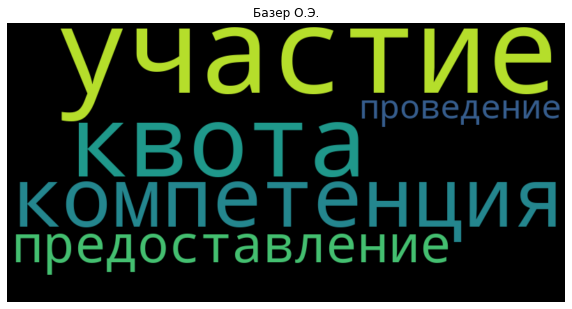

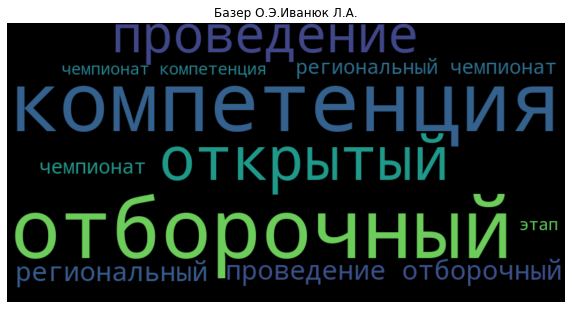

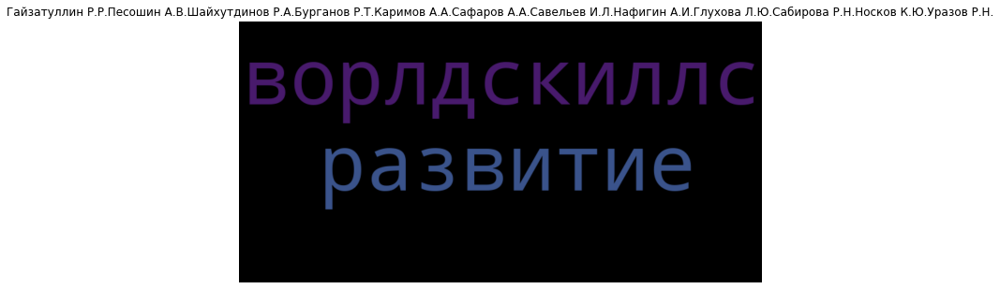

...

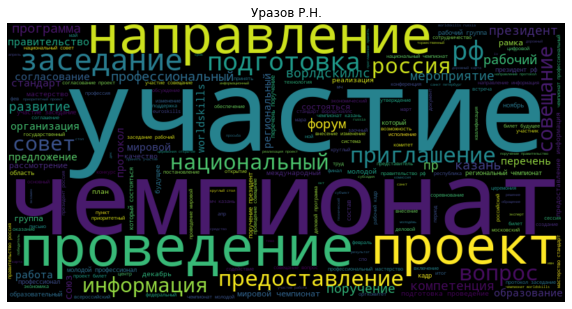

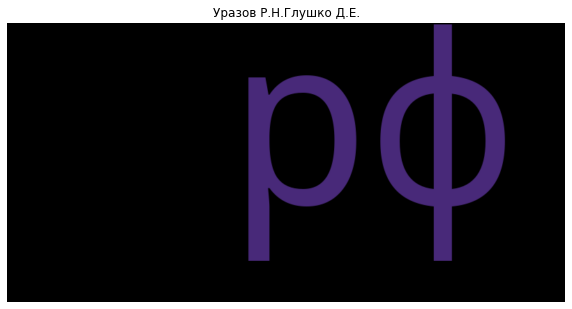

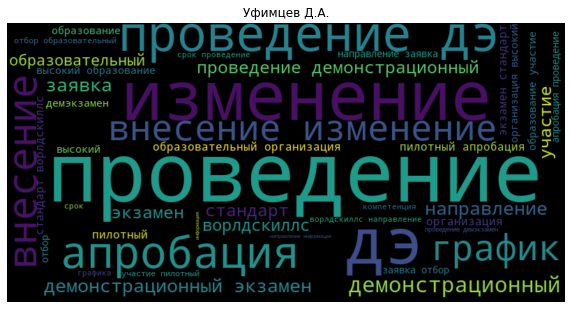

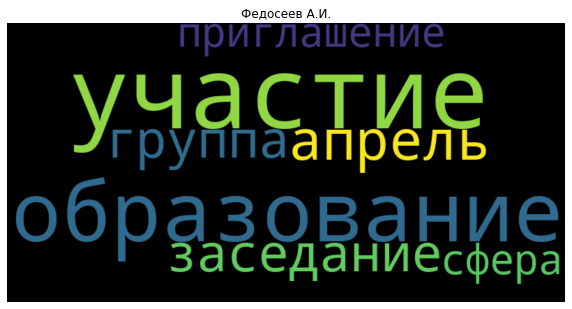

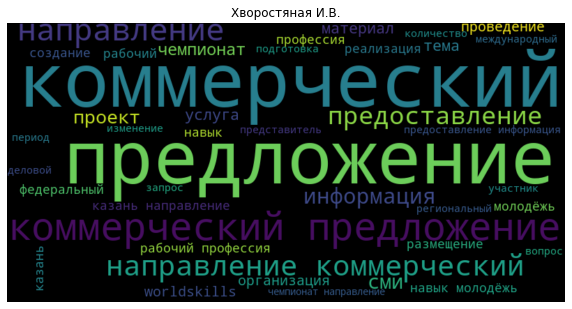

In [46]:
for c in range(len(cvDF)):
    w=[]
    for i,j in zip(cvDF.T[c].index, cvDF.T[c].values):
            a=[]
            if j > 1:
                a.append(i)
                a.append(j)
                w.append(a)
    pd.DataFrame(w)
    data1 = dict(w)
    try:
        wc = WordCloud(width=800, height=400, max_words=200).generate_from_frequencies(data1)
    except ValueError:
        continue
    plt.figure(figsize=(10, 10))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(data['adresat'][c])
    plt.show()

с помощью данной визуализации наиболее наглядно показано, какими словами можно описать тематику каждого адресата

## Вывод:
На данном этапе с помощью таких визуализаций, как barplot и WordCloud, мы:
- показали зависимость текста документов и наименований организаций от адресатов
- проанализировали влияние целевой переменной

---

# Итог:
- в данной сессии нам удалось разделить наши данные на тренировочную и тестовую выборки, а также далее проверив наше разделение с помощью трех классификаторов
- провизуализировать зависимость атрибутов от адресатов и проанализировать полученные результаты 

In [87]:
df.to_csv('df.csv')